#Downloading Eye Diseases Dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install kaggle
!mkdir -p ~/.kaggle
!cp /content/drive/MyDrive/Colab_Notebooks/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d gunavenkatdoddi/eye-diseases-classification

 98% 719M/736M [00:08<00:00, 119MB/s]
100% 736M/736M [00:08<00:00, 86.5MB/s]


In [ ]:
!unzip /content/eye-diseases-classification.zip

Archive:  /content/eye-diseases-classification.zip
  inflating: dataset/cataract/0_left.jpg  
  inflating: dataset/cataract/103_left.jpg  
  inflating: dataset/cataract/1062_right.jpg  
  inflating: dataset/cataract/1083_left.jpg  
  inflating: dataset/cataract/1084_right.jpg  
  inflating: dataset/cataract/1102_left.jpg  
  inflating: dataset/cataract/1102_right.jpg  
  inflating: dataset/cataract/1115_left.jpg  
  inflating: dataset/cataract/1126_right.jpg  
  inflating: dataset/cataract/112_right.jpg  
  inflating: dataset/cataract/1144_left.jpg  
  inflating: dataset/cataract/1144_right.jpg  
  inflating: dataset/cataract/1164_left.jpg  
  inflating: dataset/cataract/1167_right.jpg  
  inflating: dataset/cataract/119_left.jpg  
  inflating: dataset/cataract/1285_left.jpg  
  inflating: dataset/cataract/1415_left.jpg  
  inflating: dataset/cataract/1415_right.jpg  
  inflating: dataset/cataract/1435_left.jpg  
  inflating: dataset/cataract/1444_left.jpg  
  inflating: dataset/catara

#Importing the Necessary Libraries

In [ ]:
import numpy as np
import tensorflow as tf
import keras
import pandas as pd
import cv2
from PIL import Image
from tqdm import tqdm

from skimage.io import imread
from skimage.transform import rescale
from skimage.feature import hog
from skimage import exposure
from skimage import color

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import regularizers
from keras.models import Sequential, Model, load_model
from tensorflow.keras import callbacks
from tensorflow.keras.optimizers import Adam, Adamax
from keras.layers import Input, UpSampling2D, Conv2D, concatenate, MaxPooling2D, Flatten, Dense, Dropout, Activation, BatchNormalization, GlobalAveragePooling2D
from keras.preprocessing.image import load_img, img_to_array
from keras.regularizers import l1, l2

from keras.src.applications import InceptionResNetV2
from keras.src.applications.inception_resnet_v2 import preprocess_input

import os
from math import ceil
import seaborn as sns
import matplotlib.pyplot as plt

sns.set()
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

#Creating a Combined Image Dataset with Labels

In [ ]:
data_dir = "/content/dataset"

cataract_df = pd.DataFrame(columns=['filepaths', 'labels'])
diabetic_retinopathy_df = pd.DataFrame(columns=['filepaths', 'labels'])
glaucoma_df = pd.DataFrame(columns=['filepaths', 'labels'])
normal_df = pd.DataFrame(columns=['filepaths', 'labels'])

cataract_label = 'cataract'
diabetic_retinopathy_label = 'diabetic_retinopathy'
glaucoma_label = 'glaucoma'
normal_label = 'normal'


cataract_files = os.listdir(os.path.join(data_dir, "cataract"))
diabetic_retinopathy_files = os.listdir(os.path.join(data_dir, "diabetic_retinopathy"))
glaucoma_files = os.listdir(os.path.join(data_dir, "glaucoma"))
normal_files = os.listdir(os.path.join(data_dir, "normal"))


cataract_df['filepaths'] = [os.path.join(data_dir, "cataract", filename) for filename in cataract_files]
cataract_df['labels'] = cataract_label

diabetic_retinopathy_df['filepaths'] = [os.path.join(data_dir, "diabetic_retinopathy", filename) for filename in diabetic_retinopathy_files]
diabetic_retinopathy_df['labels'] = diabetic_retinopathy_label

glaucoma_df['filepaths'] = [os.path.join(data_dir, "glaucoma", filename) for filename in glaucoma_files]
glaucoma_df['labels'] = glaucoma_label

normal_df['filepaths'] = [os.path.join(data_dir, "normal", filename) for filename in normal_files]
normal_df['labels'] = normal_label


In [ ]:
combined_df = pd.concat([cataract_df, diabetic_retinopathy_df], ignore_index=True)
combined_df = pd.concat([combined_df, glaucoma_df], ignore_index=True)
combined_df = pd.concat([combined_df, normal_df], ignore_index=True)

combined_df = combined_df.sample(frac=1, random_state=42)
label_counts = combined_df['labels'].value_counts()

label_counts

diabetic_retinopathy    1098
normal                  1074
cataract                1038
glaucoma                1007
Name: labels, dtype: int64

In [ ]:
combined_df.head(5)

,filepaths,labels
463,/content/dataset/cataract/_326_3620282.jpg,cataract
2426,/content/dataset/glaucoma/_267_8024092.jpg,glaucoma
2661,/content/dataset/glaucoma/_96_982046.jpg,glaucoma
1483,/content/dataset/diabetic_retinopathy/10163_le...,diabetic_retinopathy
2860,/content/dataset/glaucoma/2048_right.jpg,glaucoma


#Exploring Data Distribution and Visualizing Images

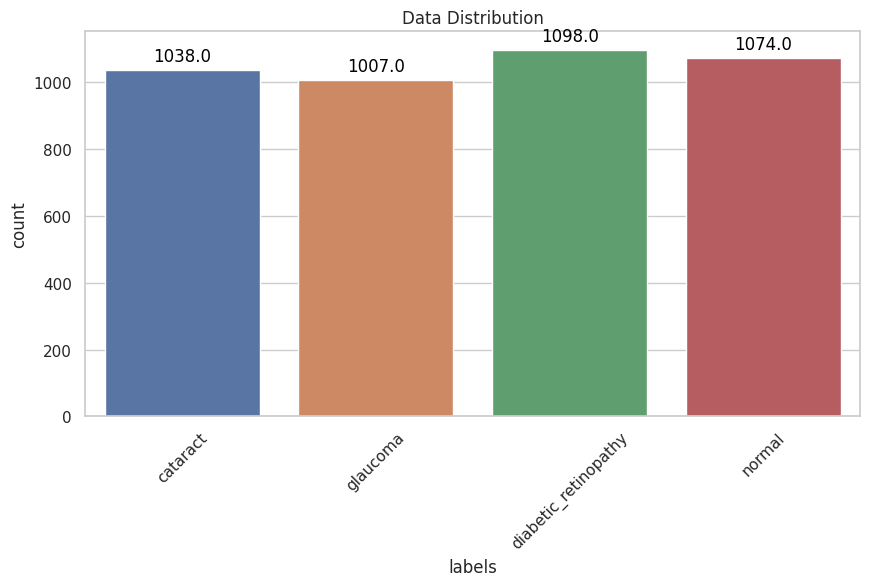

In [ ]:
plt.figure(figsize=(10, 5))
sns.set(style="whitegrid")
ax = sns.countplot(data=combined_df, x='labels')
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', fontsize=12, color='black', xytext=(0, 10), textcoords='offset points')

plt.title('Data Distribution')
plt.xticks(rotation=45)
plt.show()


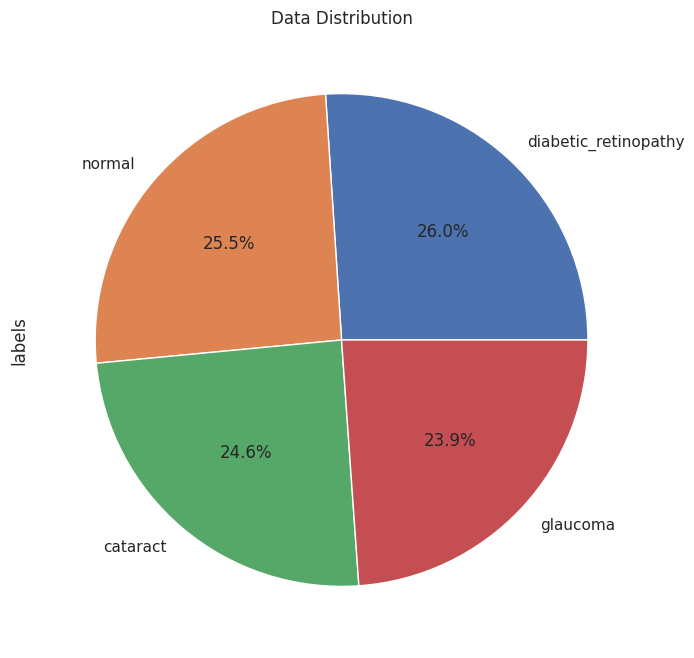

In [ ]:
plt.figure(figsize=(10, 8))
combined_df['labels'].value_counts().plot.pie(autopct='%1.1f%%')
plt.title('Data Distribution')
plt.show()

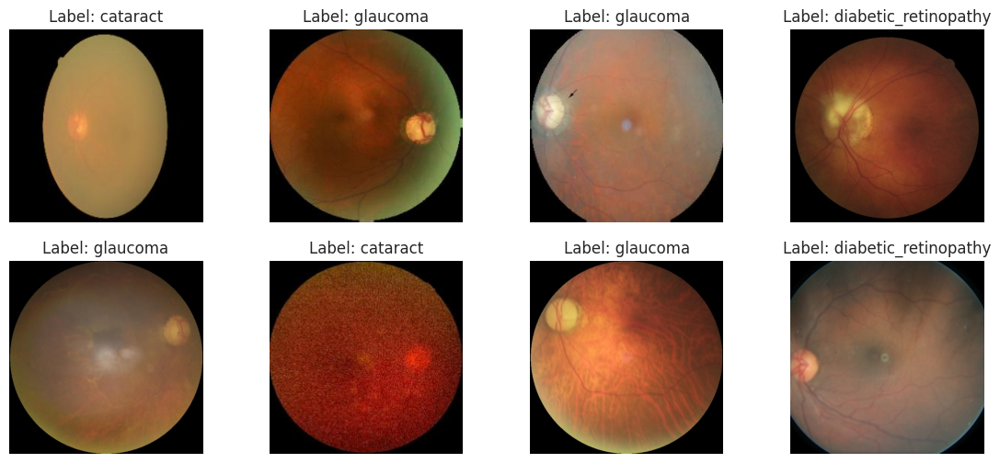

In [ ]:
def display_images(df, rows, cols):
    fig, axes = plt.subplots(rows, cols, figsize=(14, 6))
    for r in range(rows):
        for c in range(cols):
            index = r * cols + c
            if index < len(df):
                image_path = df.iloc[index]['filepaths']
                label = df.iloc[index]['labels']
                img = Image.open(image_path)
                axes[r, c].imshow(img)
                axes[r, c].set_title(f'Label: {label}')
                axes[r, c].axis('off')
            else:
                axes[r, c].axis('off')

    plt.show()

rows = 2
cols = 4

display_images(combined_df, rows, cols)

#Data Splitting and Class Distribution in Image Dataset

In [ ]:
train_df, dummy_df = train_test_split(combined_df,  train_size= 0.8, shuffle= True, random_state= 123, stratify= combined_df['labels'])

valid_df, test_df = train_test_split(dummy_df,  train_size= 0.5, shuffle= True, random_state= 123, stratify= dummy_df['labels'])

In [ ]:
train_df['labels'].value_counts()

diabetic_retinopathy    878
normal                  859
cataract                830
glaucoma                806
Name: labels, dtype: int64

In [ ]:
test_df['labels'].value_counts()

diabetic_retinopathy    110
normal                  107
cataract                104
glaucoma                101
Name: labels, dtype: int64

In [ ]:
valid_df['labels'].value_counts()

diabetic_retinopathy    110
normal                  108
cataract                104
glaucoma                100
Name: labels, dtype: int64

#Data Preprocessing and Generation

In [ ]:
def scalar(img):
        return img

train_generator = ImageDataGenerator(preprocessing_function = scalar,
                                     horizontal_flip = True)

test_generator = ImageDataGenerator(preprocessing_function = scalar)

In [ ]:
train_set = train_generator.flow_from_dataframe( train_df,
                                        x_col= 'filepaths',
                                        y_col= 'labels',
                                        target_size= (224, 224),
                                        class_mode= 'categorical',
                                        color_mode= 'rgb',
                                        shuffle= True,
                                        batch_size= 40)

Found 3373 validated image filenames belonging to 4 classes.


In [ ]:
train_set.class_indices

{'cataract': 0, 'diabetic_retinopathy': 1, 'glaucoma': 2, 'normal': 3}

In [ ]:
valid_set = test_generator.flow_from_dataframe( valid_df,
                                       x_col= 'filepaths',
                                       y_col= 'labels',
                                       target_size= (224, 224),
                                       class_mode= 'categorical',
                                       color_mode= 'rgb',
                                       shuffle= True,
                                       batch_size= 40)


Found 422 validated image filenames belonging to 4 classes.


In [ ]:
test_set = test_generator.flow_from_dataframe( test_df,
                                      x_col= 'filepaths',
                                      y_col= 'labels',
                                      target_size= (224, 224),
                                      class_mode= 'categorical',
                                      color_mode= 'rgb',
                                      shuffle= False,
                                      batch_size= 2)

Found 422 validated image filenames belonging to 4 classes.


#Deep Learning Models

##Transfer Learning(TL)

###InceptionResNetV2-based Neural Network Architecture

In [ ]:
base_model = InceptionResNetV2(include_top= False, weights= "imagenet", input_shape= (224,224,3), pooling= 'max')

x = base_model.output
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)

x = Dense(256, kernel_regularizer=l2(l=0.016), activity_regularizer=l1(0.006), bias_regularizer=l1(0.006), activation='relu')(x)
x = Dropout(rate=0.3)(x)

output = Dense(4, activation='softmax')(x)

model = Model(inputs = base_model.input, outputs = output)

model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()

219055592/219055592 [==============================] - 7s 0us/step
Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_17 (InputLayer)       [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_564 (Conv2D)         (None, 111, 111, 32)         864       ['input_17[0][0]']            
                                                                                                  
 batch_normalization_571 (B  (None, 111, 111, 32)         96        ['conv2d_564[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_564 (Activati

###Training the Model

In [ ]:
history = model.fit(x= train_set,
                    epochs= 40,
                    verbose= 1,
                    validation_data= valid_set
)

Epoch 1/40
85/85 [==============================] - 147s 807ms/step - loss: 6.9323 - accuracy: 0.8049 - val_loss: 6.1819 - val_accuracy: 0.7725
Epoch 2/40
85/85 [==============================] - 61s 716ms/step - loss: 4.7723 - accuracy: 0.9117 - val_loss: 4.9401 - val_accuracy: 0.7749
Epoch 3/40
85/85 [==============================] - 64s 745ms/step - loss: 3.5885 - accuracy: 0.9374 - val_loss: 3.1802 - val_accuracy: 0.9265
Epoch 4/40
85/85 [==============================] - 61s 718ms/step - loss: 2.7254 - accuracy: 0.9508 - val_loss: 2.4401 - val_accuracy: 0.9218
Epoch 5/40
85/85 [==============================] - 61s 718ms/step - loss: 2.0947 - accuracy: 0.9597 - val_loss: 1.9173 - val_accuracy: 0.9218
Epoch 6/40
85/85 [==============================] - 61s 718ms/step - loss: 1.6109 - accuracy: 0.9671 - val_loss: 1.5530 - val_accuracy: 0.9123
Epoch 7/40
85/85 [==============================] - 61s 721ms/step - loss: 1.2460 - accuracy: 0.9795 - val_loss: 1.2229 - val_accuracy: 0.943

###Training and Validation Performance Visualization

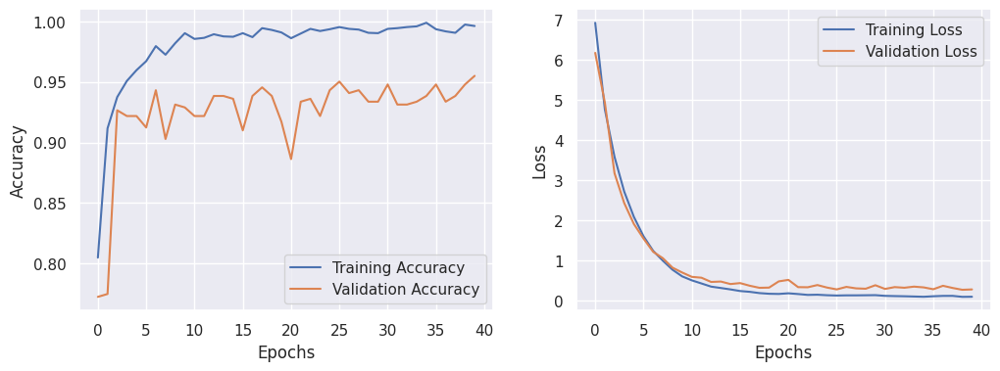

In [ ]:
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

###Model Evaluation and Image Prediction for Ophthalmic Image Classification

In [ ]:
model.save("Eye_Diseases_InceptionResntV2.h5")

In [ ]:
model = load_model("/content/Eye_Diseases_InceptionResntV2.h5")

In [ ]:
train_results = model.evaluate(train_set, verbose= 1)
valid_results = model.evaluate(valid_set, verbose= 1)
test_results = model.evaluate(test_set, verbose= 1)

print("\nTrain Loss: ", train_results[0])
print("Train Accuracy: ", train_results[1])
print('-' * 40)

print("Validation Loss: ", valid_results[0])
print("Validation Accuracy: ", valid_results[1])
print('-' * 40)

print("Test Loss: ", test_results[0])
print("Test Accuracy: ", test_results[1])

211/211 [==============================] - 8s 39ms/step - loss: 0.3001 - accuracy: 0.9431

Train Loss:  0.08408556878566742
Train Accuracy:  0.9988141059875488
----------------------------------------
Validation Loss:  0.2849918305873871
Validation Accuracy:  0.9549763202667236
----------------------------------------
Test Loss:  0.3001220226287842
Test Accuracy:  0.9431279897689819


In [ ]:
class_names = list(test_set.class_indices.keys())

predictions = model.predict_generator(test_set, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)

true_labels = test_set.classes

class_report = classification_report(true_labels, predicted_labels, target_names = class_names)
print("Classification Report:\n", class_report)

211/211 [==============================] - 12s 36ms/step
Classification Report:
                       precision    recall  f1-score   support

            cataract       0.96      0.94      0.95       104
diabetic_retinopathy       1.00      1.00      1.00       110
            glaucoma       0.91      0.91      0.91       101
              normal       0.90      0.92      0.91       107

            accuracy                           0.94       422
           macro avg       0.94      0.94      0.94       422
        weighted avg       0.94      0.94      0.94       422



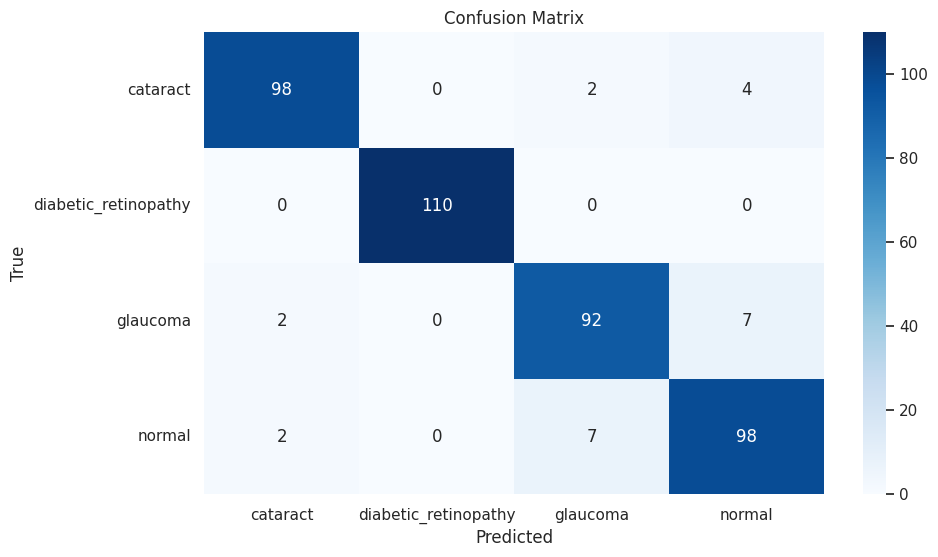

In [ ]:
confusion_mat = confusion_matrix(true_labels, predicted_labels)

plt.figure(figsize=(10, 6))
sns.heatmap(confusion_mat, annot = True, fmt = "d", cmap = "Blues", xticklabels = class_names, yticklabels = class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

1/1 [==============================] - 0s 63ms/step


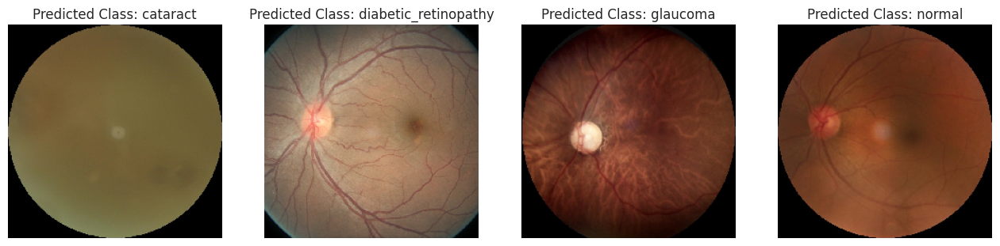

In [ ]:
def predict_and_display_images(image_paths, model):
    class_labels = ['cataract', 'diabetic_retinopathy', 'glaucoma', 'normal']

    fig, axes = plt.subplots(1, 4, figsize=(16, 4))

    for i, image_path in enumerate(image_paths):
        img = image.load_img(image_path, target_size=(224, 224))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        predictions = model.predict(img)
        predicted_class_index = np.argmax(predictions, axis=1)[0]
        predicted_class = class_labels[predicted_class_index]

        ax = axes[i]
        ax.imshow(img[0] / 255.0)
        ax.set_title(f"Predicted Class: {predicted_class}")
        ax.axis('off')

    plt.show()

image_paths = [
    '/content/dataset/cataract/0_left.jpg',
    '/content/dataset/diabetic_retinopathy/10009_right.jpeg',
    '/content/dataset/glaucoma/1212_left.jpg',
    '/content/dataset/normal/2329_left.jpg'
]


predict_and_display_images(image_paths, model)

###Activation Map Visualization and Attention Map Generation

1/1 [==============================] - 0s 168ms/step


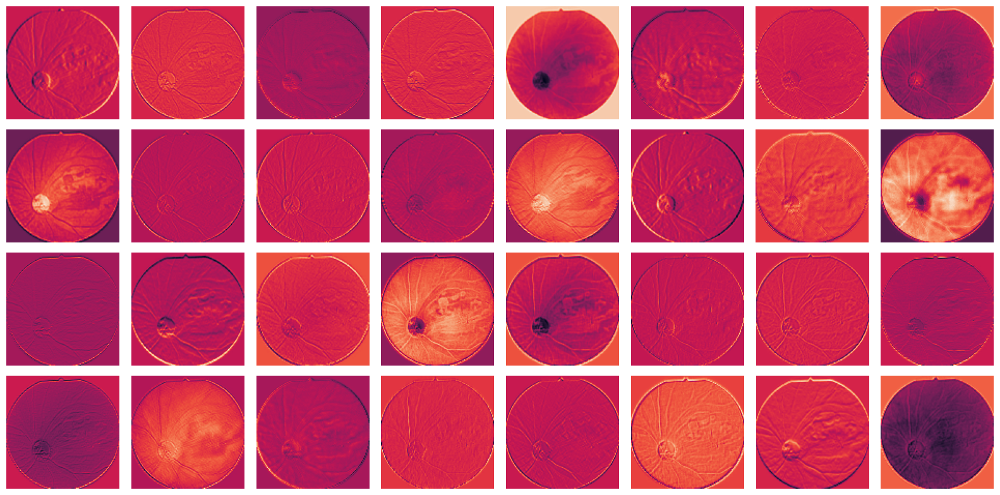

In [ ]:
def visualize_activation_maps(model, img_path, layer_name):
    img = load_img(img_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    intermediate_model = Model(inputs=model.input, outputs=model.get_layer(layer_name).output)

    activations = intermediate_model.predict(img_array)

    num_filters = activations.shape[-1]
    rows = int(np.ceil(num_filters / 8))

    fig, axs = plt.subplots(nrows=rows, ncols=8, figsize=(16, rows*2))

    for i in range(rows):
        for j in range(8):
            if i*8 + j < num_filters:
                axs[i, j].imshow(activations[0, :, :, i*8 + j])
                axs[i, j].axis('off')

    plt.tight_layout()
    plt.show()

layer_name = 'conv2d_565'
img_path = '/content/dataset/glaucoma/1020_left.jpg'

visualize_activation_maps(model, img_path, layer_name)

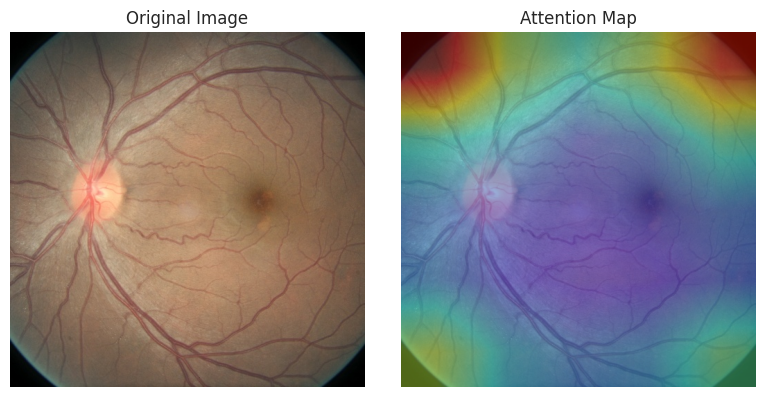

In [ ]:
def get_gradcam(model, img_array, layer_name):
    grad_model = Model(
        inputs=[model.inputs],
        outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        class_index = tf.argmax(predictions[0])
        loss = predictions[:, class_index]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]

    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    return heatmap

def visualize_attention(image_path, heatmap):
    img = cv2.imread(image_path)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
    plt.title('Attention Map')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

image_path = '/content/dataset/diabetic_retinopathy/10009_right.jpeg'
img = load_img(image_path, target_size=(224, 224))
img_array = img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array /= 255.0

layer_name = 'conv_7b_ac'
heatmap = get_gradcam(model, img_array, layer_name)

visualize_attention(image_path, heatmap)

##Convolutional Neural Network(CNN)

###Convolutional Neural Network Architecture

In [ ]:
model = Sequential()

model.add(Conv2D(32, (7, 7), activation='relu', input_shape=(224, 224, 3)))
model.add(MaxPooling2D((2, 2)))
model.add(BatchNormalization())

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(BatchNormalization())

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(BatchNormalization())

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(BatchNormalization())

model.add(Conv2D(256, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(BatchNormalization())

model.add(Conv2D(512, (3, 3), activation='relu'))
model.add(BatchNormalization())

model.add(GlobalAveragePooling2D())

model.add(Dense(512, activation='relu'))
model.add(Dense(256, activation='relu'))

model.add(Dense(4, activation='softmax'))

model.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_203 (Conv2D)         (None, 218, 218, 32)      4736      
                                                                 
 max_pooling2d_65 (MaxPooli  (None, 109, 109, 32)      0         
 ng2D)                                                           
                                                                 
 batch_normalization_18 (Ba  (None, 109, 109, 32)      128       
 tchNormalization)                                               
                                                                 
 conv2d_204 (Conv2D)         (None, 107, 107, 64)      18496     
                                                                 
 max_pooling2d_66 (MaxPooli  (None, 53, 53, 64)        0         
 ng2D)                                                           
                                                      

###Training the Model

In [ ]:
checkpoint_callback = callbacks.ModelCheckpoint(
    filepath = 'Eye_Diseases_CNN.h5',
    monitor = 'val_accuracy',
    save_best_only = True,
    mode = 'max',
    verbose = 1
)

In [ ]:
history_cnn = model.fit(x= train_set,
                        epochs= 50,
                        verbose= 1,
                        validation_data= valid_set,
                        callbacks = [checkpoint_callback]
)

Epoch 1/50
85/85 [==============================] - ETA: 0s - loss: 0.9740 - accuracy: 0.5924
Epoch 1: val_accuracy improved from -inf to 0.45261, saving model to Eye_Diseases_CNN.h5
85/85 [==============================] - 31s 316ms/step - loss: 0.9740 - accuracy: 0.5924 - val_loss: 1.7303 - val_accuracy: 0.4526
Epoch 2/50
85/85 [==============================] - ETA: 0s - loss: 0.6061 - accuracy: 0.7545
Epoch 2: val_accuracy improved from 0.45261 to 0.62085, saving model to Eye_Diseases_CNN.h5
85/85 [==============================] - 27s 314ms/step - loss: 0.6061 - accuracy: 0.7545 - val_loss: 1.2763 - val_accuracy: 0.6209
Epoch 3/50
85/85 [==============================] - ETA: 0s - loss: 0.5334 - accuracy: 0.7904
Epoch 3: val_accuracy improved from 0.62085 to 0.64929, saving model to Eye_Diseases_CNN.h5
85/85 [==============================] - 27s 317ms/step - loss: 0.5334 - accuracy: 0.7904 - val_loss: 0.9374 - val_accuracy: 0.6493
Epoch 4/50
85/85 [==============================]

###Training and Validation Performance Visualization

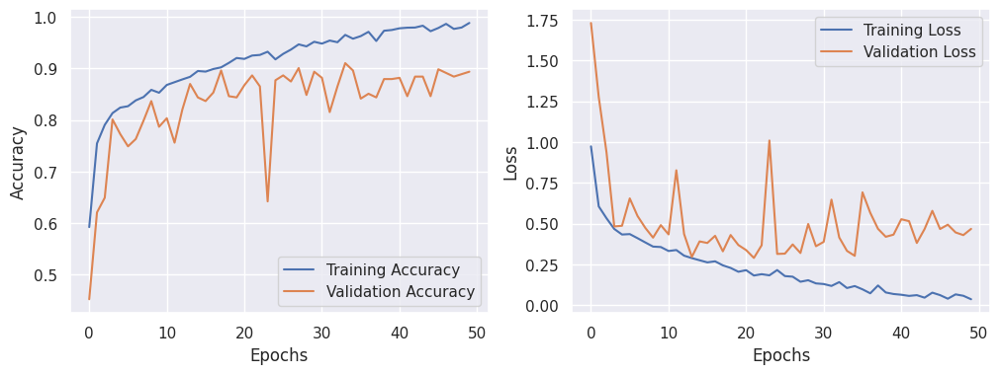

In [ ]:
train_accuracy = history_cnn.history['accuracy']
val_accuracy = history_cnn.history['val_accuracy']
train_loss = history_cnn.history['loss']
val_loss = history_cnn.history['val_loss']

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

###Model Evaluation and Image Prediction for Ophthalmic Image Classification

In [ ]:
model = load_model("/content/Eye_Diseases_CNN.h5")

In [ ]:
train_results = model.evaluate(train_set, verbose= 1)
valid_results = model.evaluate(valid_set, verbose= 1)
test_results = model.evaluate(test_set, verbose= 1)

print("\nTrain Loss: ", train_results[0])
print("Train Accuracy: ", train_results[1])
print('-' * 40)

print("Validation Loss: ", valid_results[0])
print("Validation Accuracy: ", valid_results[1])
print('-' * 40)

print("Test Loss: ", test_results[0])
print("Test Accuracy: ", test_results[1])

211/211 [==============================] - 3s 13ms/step - loss: 0.3047 - accuracy: 0.8981

Train Loss:  0.09050112217664719
Train Accuracy:  0.9656092524528503
----------------------------------------
Validation Loss:  0.3333962857723236
Validation Accuracy:  0.9099525809288025
----------------------------------------
Test Loss:  0.30468183755874634
Test Accuracy:  0.8981042504310608


In [ ]:
class_names = list(test_set.class_indices.keys())

predictions = model.predict_generator(test_set, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)

true_labels = test_set.classes

class_report = classification_report(true_labels, predicted_labels, target_names = class_names)
print("Classification Report:\n", class_report)

211/211 [==============================] - 3s 15ms/step
Classification Report:
                       precision    recall  f1-score   support

            cataract       0.83      0.96      0.89       104
diabetic_retinopathy       1.00      0.98      0.99       110
            glaucoma       0.94      0.73      0.82       101
              normal       0.85      0.91      0.88       107

            accuracy                           0.90       422
           macro avg       0.90      0.90      0.89       422
        weighted avg       0.90      0.90      0.90       422



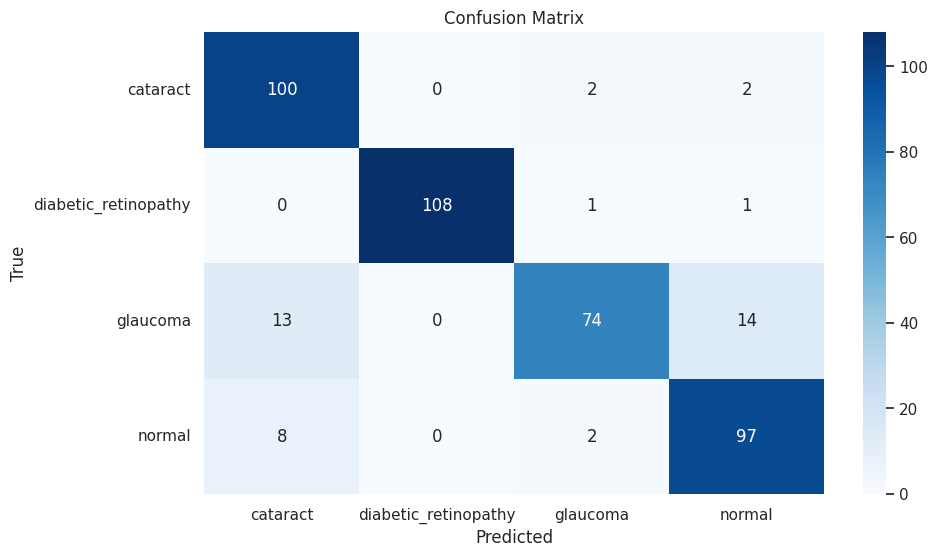

In [ ]:
confusion_mat = confusion_matrix(true_labels, predicted_labels)

plt.figure(figsize=(10, 6))
sns.heatmap(confusion_mat, annot = True, fmt = "d", cmap = "Blues", xticklabels = class_names, yticklabels = class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

1/1 [==============================] - 0s 17ms/step


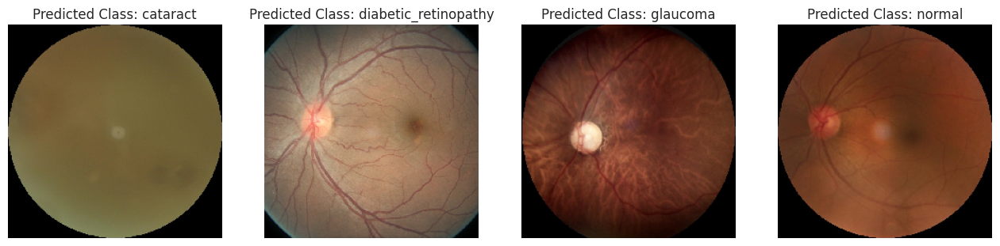

In [ ]:
def predict_and_display_images(image_paths, model):
    class_labels = ['cataract', 'diabetic_retinopathy', 'glaucoma', 'normal']

    fig, axes = plt.subplots(1, 4, figsize=(16, 4))

    for i, image_path in enumerate(image_paths):
        img = image.load_img(image_path, target_size=(224, 224))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        predictions = model.predict(img)
        predicted_class_index = np.argmax(predictions, axis=1)[0]
        predicted_class = class_labels[predicted_class_index]

        ax = axes[i]
        ax.imshow(img[0] / 255.0)
        ax.set_title(f"Predicted Class: {predicted_class}")
        ax.axis('off')

    plt.show()

image_paths = [
    '/content/dataset/cataract/0_left.jpg',
    '/content/dataset/diabetic_retinopathy/10009_right.jpeg',
    '/content/dataset/glaucoma/1212_left.jpg',
    '/content/dataset/normal/2329_left.jpg'
]


predict_and_display_images(image_paths, model)

###Activation Map Visualization and Attention Map Generation

1/1 [==============================] - 0s 39ms/step


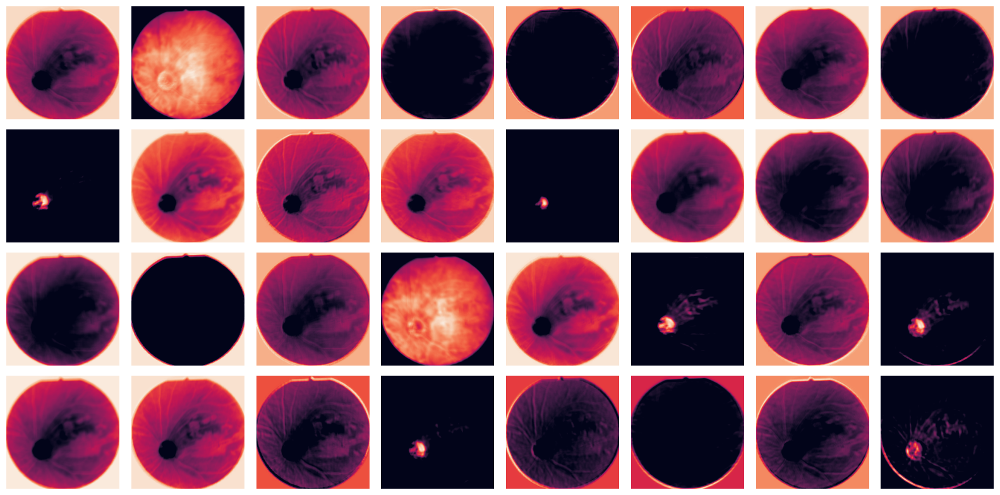

In [ ]:
def visualize_activation_maps(model, img_path, layer_name):
    img = load_img(img_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    intermediate_model = Model(inputs=model.input, outputs=model.get_layer(layer_name).output)

    activations = intermediate_model.predict(img_array)

    num_filters = activations.shape[-1]
    rows = int(np.ceil(num_filters / 8))

    fig, axs = plt.subplots(nrows=rows, ncols=8, figsize=(16, rows*2))

    for i in range(rows):
        for j in range(8):
            if i*8 + j < num_filters:
                axs[i, j].imshow(activations[0, :, :, i*8 + j])
                axs[i, j].axis('off')

    plt.tight_layout()
    plt.show()

layer_name = 'conv2d_203'
img_path = '/content/dataset/glaucoma/1020_left.jpg'

visualize_activation_maps(model, img_path, layer_name)

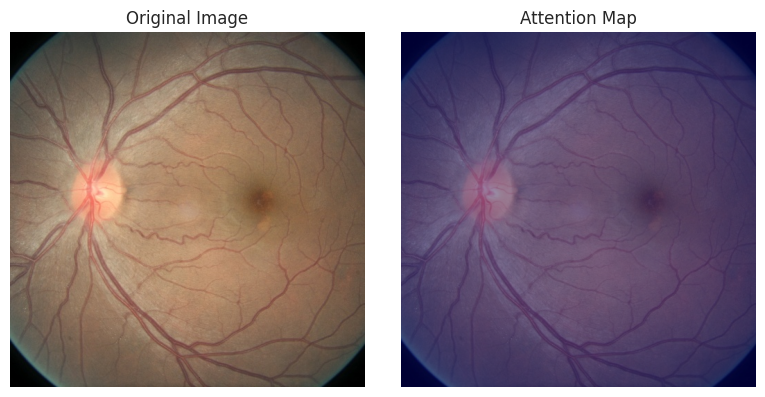

In [ ]:
def get_gradcam(model, img_array, layer_name):
    grad_model = Model(
        inputs=[model.inputs],
        outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        class_index = tf.argmax(predictions[0])
        loss = predictions[:, class_index]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]

    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    return heatmap

def visualize_attention(image_path, heatmap):
    img = cv2.imread(image_path)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
    plt.title('Attention Map')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

image_path = '/content/dataset/diabetic_retinopathy/10009_right.jpeg'
img = load_img(image_path, target_size=(224, 224))
img_array = img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array /= 255.0

layer_name = 'conv2d_207'
heatmap = get_gradcam(model, img_array, layer_name)

visualize_attention(image_path, heatmap)

##Convolutional Neural Network(CNN)

###Convolutional Neural Network with Parallel Convolution Architecture

In [ ]:
def parallel_convolution_blocks(x, filters):
    conv1x1 = Conv2D(filters[0], (1, 1), padding='same', activation='relu')(x)

    conv1x1_3x3 = Conv2D(filters[1], (1, 1), padding='same', activation='relu')(x)
    conv3x3 = Conv2D(filters[2], (3, 3), padding='same', activation='relu')(conv1x1_3x3)

    conv1x1_5x5 = Conv2D(filters[3], (1, 1), padding='same', activation='relu')(x)
    conv5x5 = Conv2D(filters[4], (5, 5), padding='same', activation='relu')(conv1x1_5x5)

    maxpool = MaxPooling2D((3, 3), strides=(1, 1), padding='same')(x)
    conv1x1_maxpool = Conv2D(filters[5], (1, 1), padding='same', activation='relu')(maxpool)

    feature_fusion = concatenate([conv1x1, conv3x3, conv5x5, conv1x1_maxpool], axis=-1)
    return feature_fusion

input = Input(shape=(224, 224, 3))
x = input

x = Conv2D(64, (7, 7), strides=(2, 2), padding='same', activation='relu')(x)
x = MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

x = parallel_convolution_blocks(x, [64, 128, 128, 32, 32, 32])
x = parallel_convolution_blocks(x, [128, 192, 96, 64, 64, 64])
x = MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

x = parallel_convolution_blocks(x, [32, 64, 64, 16, 16, 32])
x = parallel_convolution_blocks(x, [64, 192, 128, 64, 64, 32])
x = MaxPooling2D((2, 2), strides=(2, 2), padding='same')(x)

x = parallel_convolution_blocks(x, [64, 128, 128, 32, 32, 32])
x = parallel_convolution_blocks(x, [128, 192, 96, 128, 128, 128])
x = MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)

output = Dense(4, activation='softmax')(x)

model = Model(input, output)

model.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)


model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_148 (Conv2D)         (None, 112, 112, 64)         9472      ['input_5[0][0]']             
                                                                                                  
 max_pooling2d_40 (MaxPooli  (None, 56, 56, 64)           0         ['conv2d_148[0][0]']          
 ng2D)                                                                                            
                                                                                                  
 conv2d_150 (Conv2D)         (None, 56, 56, 128)          8320      ['max_pooling2d_40[0][0]

###Training the Model

In [ ]:
checkpoint_callback = callbacks.ModelCheckpoint(
    filepath = 'Eye_Diseases_CNN_with_Parallel_Convolution.h5',
    monitor = 'val_accuracy',
    save_best_only = True,
    mode = 'max',
    verbose = 1
)

In [ ]:
history = model.fit(
    train_set,
    validation_data = valid_set,
    epochs = 50,
    callbacks = [checkpoint_callback],
    verbose = 1
)

Epoch 1/50
85/85 [==============================] - ETA: 0s - loss: 1.8939 - accuracy: 0.3993
Epoch 1: val_accuracy improved from -inf to 0.50474, saving model to best_cnn_model.h5
85/85 [==============================] - 41s 352ms/step - loss: 1.8939 - accuracy: 0.3993 - val_loss: 1.0672 - val_accuracy: 0.5047
Epoch 2/50
85/85 [==============================] - ETA: 0s - loss: 0.9385 - accuracy: 0.6081
Epoch 2: val_accuracy improved from 0.50474 to 0.59242, saving model to best_cnn_model.h5
85/85 [==============================] - 32s 375ms/step - loss: 0.9385 - accuracy: 0.6081 - val_loss: 0.9408 - val_accuracy: 0.5924
Epoch 3/50
85/85 [==============================] - ETA: 0s - loss: 0.6848 - accuracy: 0.7145
Epoch 3: val_accuracy improved from 0.59242 to 0.74882, saving model to best_cnn_model.h5
85/85 [==============================] - 30s 350ms/step - loss: 0.6848 - accuracy: 0.7145 - val_loss: 0.6191 - val_accuracy: 0.7488
Epoch 4/50
85/85 [==============================] - ETA

###Training and Validation Performance Visualization

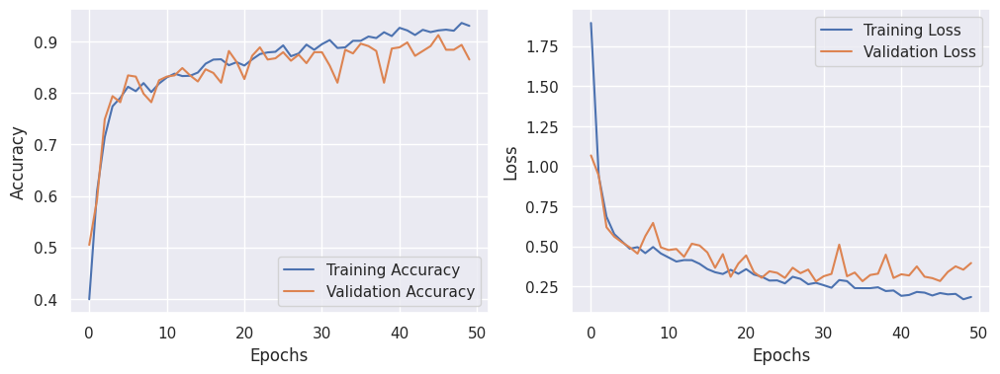

In [ ]:
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

###Model Evaluation and Image Prediction for Ophthalmic Image Classification

In [ ]:
model = load_model("/content/Eye_Diseases_CNN_with_Parallel_Convolution.h5")

In [ ]:
train_results = model.evaluate(train_set, verbose= 1)
valid_results = model.evaluate(valid_set, verbose= 1)
test_results = model.evaluate(test_set, verbose= 1)

print("\nTrain Loss: ", train_results[0])
print("Train Accuracy: ", train_results[1])
print('-' * 40)

print("Validation Loss: ", valid_results[0])
print("Validation Accuracy: ", valid_results[1])
print('-' * 40)

print("Test Loss: ", test_results[0])
print("Test Accuracy: ", test_results[1])

211/211 [==============================] - 4s 17ms/step - loss: 0.2323 - accuracy: 0.9336

Train Loss:  0.1740650236606598
Train Accuracy:  0.9332938194274902
----------------------------------------
Validation Loss:  0.28324371576309204
Validation Accuracy:  0.9123222827911377
----------------------------------------
Test Loss:  0.2322981208562851
Test Accuracy:  0.9336493015289307


In [ ]:
class_names = list(test_set.class_indices.keys())

predictions = model.predict_generator(test_set, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)

true_labels = test_set.classes

class_report = classification_report(true_labels, predicted_labels, target_names = class_names)
print("Classification Report:\n", class_report)

211/211 [==============================] - 3s 14ms/step
Classification Report:
                       precision    recall  f1-score   support

            cataract       0.91      0.92      0.92       104
diabetic_retinopathy       1.00      1.00      1.00       110
            glaucoma       0.91      0.86      0.88       101
              normal       0.91      0.94      0.93       107

            accuracy                           0.93       422
           macro avg       0.93      0.93      0.93       422
        weighted avg       0.93      0.93      0.93       422



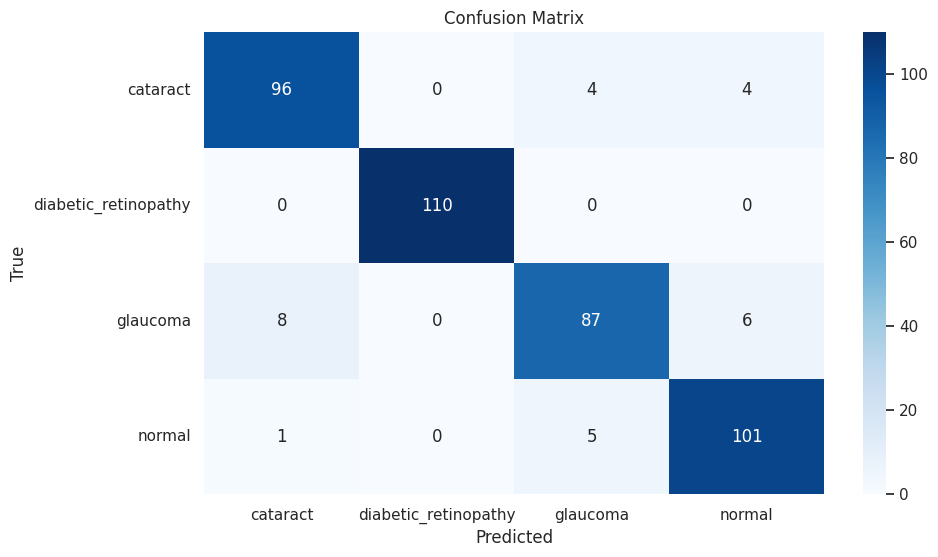

In [ ]:
confusion_mat = confusion_matrix(true_labels, predicted_labels)

plt.figure(figsize=(10, 6))
sns.heatmap(confusion_mat, annot = True, fmt = "d", cmap = "Blues", xticklabels = class_names, yticklabels = class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

1/1 [==============================] - 0s 24ms/step


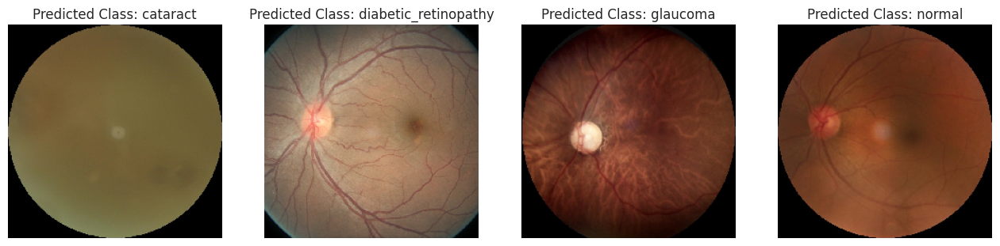

In [ ]:
def predict_and_display_images(image_paths, model):
    class_labels = ['cataract', 'diabetic_retinopathy', 'glaucoma', 'normal']

    fig, axes = plt.subplots(1, 4, figsize=(16, 4))

    for i, image_path in enumerate(image_paths):
        img = image.load_img(image_path, target_size=(224, 224))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        predictions = model.predict(img)
        predicted_class_index = np.argmax(predictions, axis=1)[0]
        predicted_class = class_labels[predicted_class_index]

        ax = axes[i]
        ax.imshow(img[0] / 255.0)
        ax.set_title(f"Predicted Class: {predicted_class}")
        ax.axis('off')

    plt.show()

image_paths = [
    '/content/dataset/cataract/0_left.jpg',
    '/content/dataset/diabetic_retinopathy/10009_right.jpeg',
    '/content/dataset/glaucoma/1212_left.jpg',
    '/content/dataset/normal/2329_left.jpg'
]


predict_and_display_images(image_paths, model)

###Activation Map Visualization and Attention Map Generation

1/1 [==============================] - 0s 73ms/step


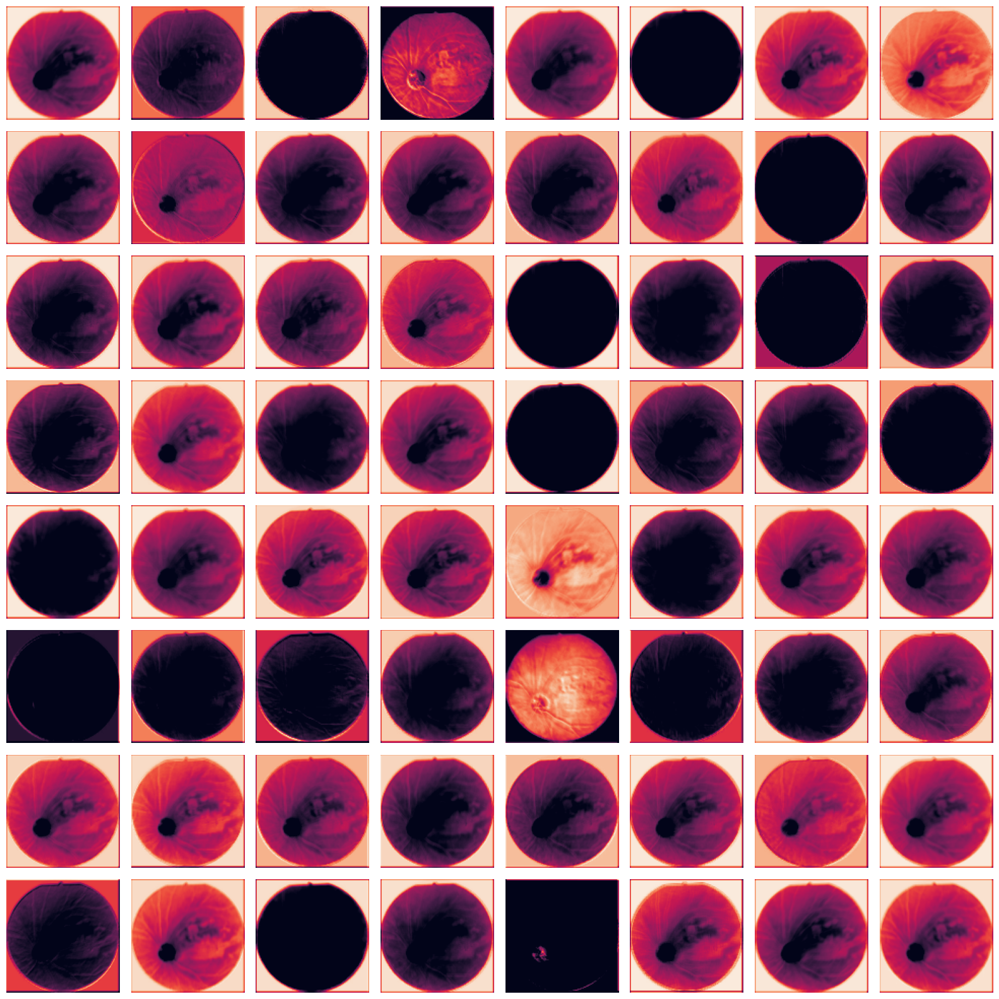

In [ ]:
def visualize_activation_maps(model, img_path, layer_name):
    img = load_img(img_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    intermediate_model = Model(inputs=model.input, outputs=model.get_layer(layer_name).output)

    activations = intermediate_model.predict(img_array)

    num_filters = activations.shape[-1]
    rows = int(np.ceil(num_filters / 8))

    fig, axs = plt.subplots(nrows=rows, ncols=8, figsize=(16, rows*2))

    for i in range(rows):
        for j in range(8):
            if i*8 + j < num_filters:
                axs[i, j].imshow(activations[0, :, :, i*8 + j])
                axs[i, j].axis('off')

    plt.tight_layout()
    plt.show()

layer_name = 'conv2d_148'
img_path = '/content/dataset/glaucoma/1020_left.jpg'

visualize_activation_maps(model, img_path, layer_name)

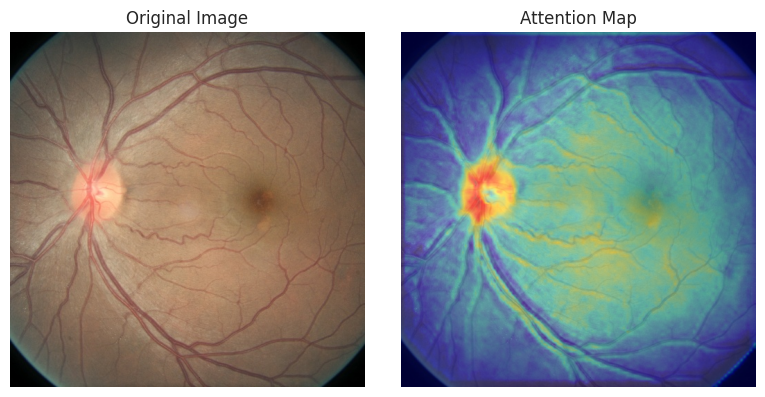

In [ ]:
def get_gradcam(model, img_array, layer_name):
    grad_model = Model(
        inputs=[model.inputs],
        outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        class_index = tf.argmax(predictions[0])
        loss = predictions[:, class_index]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]

    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    return heatmap

def visualize_attention(image_path, heatmap):
    img = cv2.imread(image_path)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
    plt.title('Attention Map')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

image_path = '/content/dataset/diabetic_retinopathy/10009_right.jpeg'
img = load_img(image_path, target_size=(224, 224))
img_array = img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array /= 255.0

layer_name = 'conv2d_148'
heatmap = get_gradcam(model, img_array, layer_name)

visualize_attention(image_path, heatmap)